In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import chi2
from kneed import KneeLocator
from scipy.stats import ttest_ind

## TEC res

In [4]:
#
file_path = "/home/nccpml/DATA2/hanbyeol/TEC/gcam_res08/"
file_list = sorted([f for f in os.listdir(file_path) 
             if f.startswith("gcamplus_result_TEC_v") and f.endswith(".txt")])
file_list

FileNotFoundError: [Errno 2] No such file or directory: '/home/nccpml/DATA2/hanbyeol/TEC/gcam_res08/'

In [102]:
# 데이터 프레임을 저장할 빈 리스트 생성
dfs = []

# 파일 리스트에 대해 반복하며 데이터 프레임 생성 및 리스트에 추가
for file in sorted(file_list):
    df = pd.read_csv(file_path + file, sep='\t')
    df = df.sort_values(by='Normalized_Weight', ascending=False).reset_index(drop=True)
    # df = df.head(n=50)
    dfs.append(df)

dfs[0]

,TumorCell,TEC,Normalized_Weight
0,VIP,RAMP2,1.000000
1,AVP,RAMP2,0.994312
2,PTH2,RAMP2,0.988620
3,GCG,RAMP2,0.982931
4,GHRH,RAMP2,0.982520
...,...,...,...
13155,SMAD3,UBB,0.001488
13156,ADRB2,UBC,0.000997
13157,TGFBR1,UBB,0.000906
13158,TGFBR2,UBB,0.000323


In [103]:
int(ref_value)

658

### Z-Score 확인

In [104]:
# 파일 리스트에 대해 반복하며 데이터 프레임 생성 및 리스트에 추가
ref_value = int(len(dfs[0].index)*0.05)

dfs = []

for file in sorted(file_list):
    df = pd.read_csv(file_path + file, sep='\t')
    df = df.sort_values(by='Normalized_Weight', ascending=False).reset_index(drop=True)
    df = df.head(n=ref_value)
    dfs.append(df)

# 유전자 pair의 등장 횟수 계산
pair_count = {}
pair_weights = {}

for df in dfs:
    for index, row in df.iterrows():
        pair = (row['TumorCell'], row['TEC'])
        if pair not in pair_count:
            pair_count[pair] = 0
            pair_weights[pair] = []
        pair_count[pair] += 1
        pair_weights[pair].append(row['Normalized_Weight'])

# 공통 유전자 쌍 데이터 프레임 생성
common_pairs = [(pair[0], pair[1], pair_count[pair]) for pair in pair_count if pair_count[pair] > 1]
common_df = pd.DataFrame(common_pairs, columns=['TumorCell', 'TEC', 'Count'])

# Z 점수 계산 및 통합
z_score_columns = {f'Z_Score_{i+1}': [] for i in range(len(dfs))}

for pair in common_df.itertuples():
    pair_key = (pair.TumorCell, pair.TEC)
    for i, df in enumerate(dfs):
        mean_weight = df['Normalized_Weight'].mean()
        std_weight = df['Normalized_Weight'].std()
        weight = df[(df['TumorCell'] == pair_key[0]) & (df['TEC'] == pair_key[1])]['Normalized_Weight'].values
        if weight.size > 0:
            z_score = (weight[0] - mean_weight) / std_weight
            z_score_columns[f'Z_Score_{i+1}'].append(z_score)
        else:
            z_score_columns[f'Z_Score_{i+1}'].append(np.nan)

for col in z_score_columns:
    common_df[col] = z_score_columns[col]

# 평균 Normalized_Weight 계산 및 추가
mean_weights = []
for pair in common_df.itertuples():
    pair_key = (pair.TumorCell, pair.TEC)
    all_weights = []
    for df in dfs:
        weight = df[(df['TumorCell'] == pair_key[0]) & (df['TEC'] == pair_key[1])]['Normalized_Weight'].values
        if weight.size > 0:
            all_weights.append(weight[0])
    mean_weights.append(np.mean(all_weights) if all_weights else np.nan)

common_df['Mean_Normalized_Weight'] = mean_weights
    
# Z 점수의 절댓값을 취한 후 평균 계산
common_df['Mean_Abs_Z_Score'] = common_df[[col for col in z_score_columns]].abs().mean(axis=1)

# 공통 Count 순으로 데이터 프레임 정렬
common_df = common_df.sort_values(by='Mean_Normalized_Weight', ascending=False).reset_index(drop=True)

# 출력 결과 확인
common_df.head(30)


,TumorCell,TEC,Count,Z_Score_1,Z_Score_2,Z_Score_3,Z_Score_4,Z_Score_5,Z_Score_6,Z_Score_7,Z_Score_8,Z_Score_9,Z_Score_10,Mean_Normalized_Weight,Mean_Abs_Z_Score
0,ITGAM,F10,10,2.736087,3.549001,5.576372,6.413421,-0.128896,2.965007,4.561956,1.255197,4.245793,7.546874,0.834507,3.897860
1,ITGB2,F10,10,2.740470,3.374216,4.917441,5.935374,-0.157757,2.773242,4.196951,1.956693,3.816548,6.404314,0.809096,3.627301
2,GCG,RAMP2,10,4.504141,3.547469,0.043776,1.766852,-0.498644,4.508616,4.034591,4.122625,4.393812,2.423328,0.751656,2.984385
3,PTH2,RAMP2,10,4.552343,3.705516,-0.024341,1.897313,-0.513579,4.512370,3.972998,4.093889,4.186302,2.505255,0.751509,2.996390
4,AVP,RAMP2,10,4.600566,3.863532,-0.092458,2.027772,-0.528511,4.516153,3.911447,4.065169,3.978811,2.587152,0.751362,3.017157
5,VIP,RAMP2,10,4.648758,4.021569,-0.160583,2.158213,-0.543443,4.519952,3.849894,4.036446,3.771301,2.669071,0.751215,3.037923
6,CGA,RAMP2,10,4.470767,3.401432,0.095619,1.662618,-0.485482,4.493489,4.080369,4.103294,4.531423,2.369949,0.750649,2.969444
7,ADM,RAMP2,10,4.480724,3.290405,0.099912,1.634972,-0.477495,4.445275,4.080014,3.943592,4.464892,2.399898,0.746272,2.931718
8,CALCA,RAMP2,10,4.490708,3.179370,0.104199,1.607346,-0.469511,4.397051,4.079672,3.783877,4.398354,2.429865,0.741894,2.893995
9,GHRH,RAMP2,10,4.500656,3.068337,0.108484,1.579699,-0.461527,4.348840,4.079329,3.624177,4.331797,2.459807,0.737516,2.856265


### Statistical analysis
7개의 결과 Normalized_Weight에 대한 통계적 분석

In [105]:
## 모든 클래스 한번에 
# 파일 이름 패턴에 따라 파일 리스트 생성
path = '/home/nccpml/DATA2/hanbyeol/TEC/gcam_res08/'
save_path = "/home/nccpml/DATA2/hanbyeol/TEC/CCI_res08/"

if not os.path.exists(save_path):
    os.makedirs(save_path)

class_names = ['TEC', 'NEC', 'Myeloid', 'Epithelial', 'Fibro_Peri', 'TandNK', 'B']

for cell in class_names:
    file_list = [f for f in os.listdir(path) 
                 if f.startswith("gcamplus_result_" + cell + "_v") and f.endswith(".txt")]
    
    # 데이터 프레임을 저장할 빈 리스트 생성
    dfs = []
        
    # 파일 리스트에 대해 반복하며 데이터 프레임 생성 및 리스트에 추가
    for file in sorted(file_list):
        df = pd.read_csv(path + file, sep='\t')
        df = df.sort_values(by='Normalized_Weight', ascending=False).reset_index(drop=True)
        df = df.head(n=ref_value)
        dfs.append(df)
        
    # 유전자 pair의 등장 횟수 계산
    gene_pairs = []
    tumor = df.columns[0]
    other = df.columns[1]
    
    # TumorCell, TEC pair의 수 계산
    for df in dfs:
        for index, row in df.iterrows():
            gene_pairs.append((row[tumor], row[other]))
    
    # 리스트를 데이터 프레임으로 변환
    common_pairs_df = pd.DataFrame(gene_pairs, columns=[tumor, other])
    
    # TumorCell과 TEC pair의 빈도수 계산
    common_pairs_df['Count'] = common_pairs_df.groupby([tumor, other])[other].transform('count')
    
    # 중복 제거
    common_pairs_df = common_pairs_df.drop_duplicates().reset_index(drop=True)
    
    # Count 열을 기준으로 내림차순 정렬
    common_pairs_df_50 = common_pairs_df.sort_values(by='Count', ascending=False).reset_index(drop=True)

    # 유전자 쌍의 빈도 계산
    gene_pair_counts = {}
    for df in dfs:
        for index, row in df.iterrows():
            pair = (row[df.columns[0]], row[df.columns[1]])
            gene_pair_counts[pair] = gene_pair_counts.get(pair, 0) + 1
    
    # 각 유전자 쌍별로 Normalized_Weight 값 수집
    gene_pair_weights = {pair: [] for pair in gene_pair_counts.keys()}
    for df in dfs:
        for index, row in df.iterrows():
            pair = (row[df.columns[0]], row[df.columns[1]])
            if pair in gene_pair_weights:
                gene_pair_weights[pair].append(row[df.columns[2]])
    
    # 통계적 분석 수행 (평균, 분산, 표준편차, 중앙값 계산)
    stats_results = []
    for pair, weights in gene_pair_weights.items():
        if weights:  # weights 리스트가 비어있지 않은 경우에만 계산
            mean_weight = np.mean(weights)
            variance_weight = np.var(weights)
            std_dev_weight = np.std(weights)  # 표준편차 계산
            median_weight = np.median(weights)  # 중앙값 계산
            cv_weight = std_dev_weight / mean_weight * 100 if mean_weight else 0  # CV 계산
            stats_results.append({
                df.columns[0]: pair[0],
                df.columns[1]: pair[1],
                'Mean Normalized_Weight': mean_weight,
                'Variance Normalized_Weight': variance_weight,
                'Std Dev Normalized_Weight': std_dev_weight,  # 추가된 표준편차
                'Median Normalized_Weight': median_weight,  # 추가된 중앙값
                'CV Normalized_Weight': cv_weight,  # CV 추가
                'Count': gene_pair_counts[pair]
            })
    
    stats_df = pd.DataFrame(stats_results)
    
    # 결과 데이터 프레임을 등장 횟수에 따라 정렬
    stats_df_sorted = stats_df.sort_values(by='Count', ascending=False).reset_index(drop=True)

    # 저장
    stats_df_sorted.set_index(stats_df_sorted.columns[0], inplace=True)
    file_name = "gcam_" + cell + "_res.csv"
    stats_df_sorted.to_csv(save_path + file_name)
    print(f"Completed: {file_name}")

Completed: gcam_TEC_res.csv
Completed: gcam_NEC_res.csv
Completed: gcam_Myeloid_res.csv
Completed: gcam_Epithelial_res.csv
Completed: gcam_Fibro_Peri_res.csv
Completed: gcam_TandNK_res.csv
Completed: gcam_B_res.csv


In [106]:
# load data

path = '/home/nccpml/DATA2/hanbyeol/TEC/CCI_res08/'

dfs = {}
file_list = [f for f in os.listdir(path) 
            if f.startswith("gcam_") and f.endswith(".csv")]

for file in file_list:
    key = file.split("gcam_")[1].split("_res")[0]  # 'gcam_' 이후와 '._res' 이전의 문자열 추출
    df = pd.read_csv(path + file)
    dfs[key] = df

## TIP res

### GradCAM++ result load

grad 결과로 나온 상위 50 개의 상호작용 선택하여 데이터 프레임

In [2]:
# TIP res
file_path = "/home/nccpml/DATA2/hanbyeol/TEC/gcam_res091/"
file_list = sorted([f for f in os.listdir(file_path) 
             if f.startswith("gcamplus_result_Tip_Cells_v") and f.endswith(".txt")])

dfs = []

# 파일 리스트에 대해 반복하며 데이터 프레임 생성 및 리스트에 추가
for file in sorted(file_list):
    df = pd.read_csv(file_path + file, sep='\t')
    df = df.sort_values(by='Normalized_Weight', ascending=False).reset_index(drop=True)
    # df = df.head(n=50)
    dfs.append(df)

dfs[7]

,TumorCell,Tip_Cells,Normalized_Weight
0,CD93,COL4A1,1.000000
1,ITGA2,COL9A3,0.984563
2,ITGA1,LAMA3,0.856704
3,CD93,C1QA,0.850151
4,ITGA2,COL9A2,0.822607
...,...,...,...
12957,CRHR2,UCN2,0.012049
12958,IGF1R,GNAI2,0.009726
12959,KLRD1,HLA-B,0.009459
12960,IGF1R,IGF2,0.004810


### Optimal N

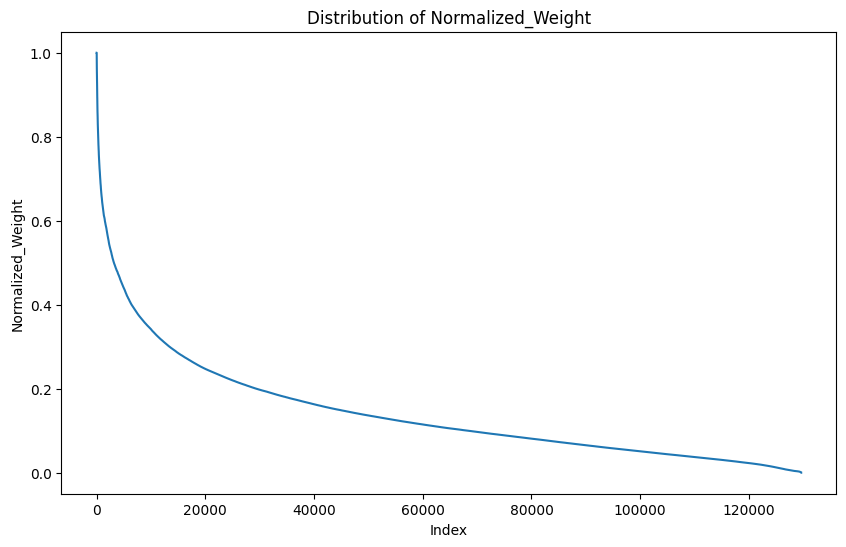

In [23]:
# 모든 DataFrame의 Normalized_Weight 값을 하나의 리스트로 결합
all_weights = pd.concat([df['Normalized_Weight'] for df in dfs])

# Normalized_Weight 값을 내림차순으로 정렬
weights_sorted = sorted(all_weights, reverse=True)

# 시각화
plt.figure(figsize=(10, 6))
plt.plot(weights_sorted)
plt.xlabel('Index')
plt.ylabel('Normalized_Weight')
plt.title('Distribution of Normalized_Weight')
plt.show()

In [24]:
# Elbow Method를 사용하여 최적의 N 선택
kneedle = KneeLocator(range(len(weights_sorted)), weights_sorted, curve='convex', direction='decreasing')
optimal_N = kneedle.elbow
print(f"Optimal N: {optimal_N}")


Optimal N: 0


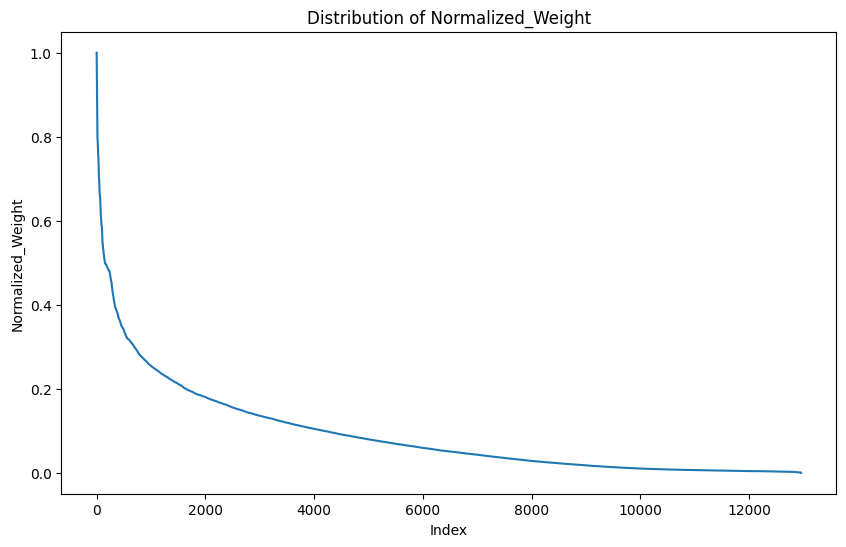

In [27]:
# 모든 Normalized_Weight 값을 하나의 리스트로 결합

weights = dfs[6]['Normalized_Weight']

# Normalized_Weight 값을 내림차순으로 정렬
weights_sorted = sorted(weights, reverse=True)

# 시각화
plt.figure(figsize=(10, 6))
plt.plot(weights_sorted)
plt.xlabel('Index')
plt.ylabel('Normalized_Weight')
plt.title('Distribution of Normalized_Weight')
plt.show()


In [73]:
# Elbow Method를 사용하여 최적의 N 선택
kneedle = KneeLocator(range(len(weights_sorted)), weights_sorted, curve='convex', direction='decreasing')
optimal_N = kneedle.elbow
print(f"Optimal N: {optimal_N}")


Optimal N: 220


In [74]:
# 각 데이터프레임의 optimal_N 값을 저장할 리스트
optimal_N_list = []

for df in dfs:
    weights_sorted = sorted(df['Normalized_Weight'], reverse=True)
    kneedle = KneeLocator(range(len(weights_sorted)), weights_sorted, curve='convex', direction='decreasing')
    optimal_N = kneedle.elbow
    optimal_N_list.append(optimal_N)

# Optimal N 값 확인
print("Optimal N values for each dataframe:")
print(optimal_N_list)


Optimal N values for each dataframe:
[167, 255, 319, 229, 378, 114, 2, 303, 358, 184]


In [75]:
# Optimal N 값의 평균 계산
average_optimal_N = int(np.mean([n for n in optimal_N_list if n is not None]))
print(f"Average Optimal N: {average_optimal_N}")

Average Optimal N: 230


In [76]:
12962*0.05

648.1

### Z-Score 확인

In [26]:
# # 파일 경로와 파일 리스트 설정
path = '/home/nccpml/DATA2/hanbyeol/TEC/gcam_res091/'
ref_value = int(len(dfs[0].index)*0.05)

# 데이터 프레임을 저장할 빈 리스트 생성
dfs = []

# 파일 리스트에 대해 반복하며 데이터 프레임 생성 및 리스트에 추가
for file in sorted(file_list):
    df = pd.read_csv(path + file, sep='\t')
    df = df.sort_values(by='Normalized_Weight', ascending=False).reset_index(drop=True)
    df = df.head(n=ref_value)
    dfs.append(df)

# 유전자 pair의 등장 횟수 계산
pair_count = {}
pair_weights = {}

for df in dfs:
    for index, row in df.iterrows():
        pair = (row['TumorCell'], row['Tip_Cells'])
        if pair not in pair_count:
            pair_count[pair] = 0
            pair_weights[pair] = []
        pair_count[pair] += 1
        pair_weights[pair].append(row['Normalized_Weight'])

# 공통 유전자 쌍 데이터 프레임 생성
common_pairs = [(pair[0], pair[1], pair_count[pair]) for pair in pair_count if pair_count[pair] > 1]
common_df = pd.DataFrame(common_pairs, columns=['TumorCell', 'Tip_Cells', 'Count'])

# Z 점수 계산 및 통합
z_score_columns = {f'Z_Score_{i+1}': [] for i in range(len(dfs))}

for pair in common_df.itertuples():
    pair_key = (pair.TumorCell, pair.Tip_Cells)
    for i, df in enumerate(dfs):
        mean_weight = df['Normalized_Weight'].mean()
        std_weight = df['Normalized_Weight'].std()
        weight = df[(df['TumorCell'] == pair_key[0]) & (df['Tip_Cells'] == pair_key[1])]['Normalized_Weight'].values
        if weight.size > 0:
            z_score = (weight[0] - mean_weight) / std_weight
            z_score_columns[f'Z_Score_{i+1}'].append(z_score)
        else:
            z_score_columns[f'Z_Score_{i+1}'].append(np.nan)

for col in z_score_columns:
    common_df[col] = z_score_columns[col]

# 평균 Normalized_Weight 계산 및 추가
mean_weights = []
for pair in common_df.itertuples():
    pair_key = (pair.TumorCell, pair.Tip_Cells)
    all_weights = []
    for df in dfs:
        weight = df[(df['TumorCell'] == pair_key[0]) & (df['Tip_Cells'] == pair_key[1])]['Normalized_Weight'].values
        if weight.size > 0:
            all_weights.append(weight[0])
    mean_weights.append(np.mean(all_weights) if all_weights else np.nan)

common_df['Mean_Normalized_Weight'] = mean_weights
    
# Z 점수의 절댓값을 취한 후 평균 계산
common_df['Mean_Abs_Z_Score'] = common_df[[col for col in z_score_columns]].abs().mean(axis=1)

# 공통 Count 순으로 데이터 프레임 정렬
common_df = common_df.sort_values(by='Mean_Normalized_Weight', ascending=False).reset_index(drop=True)

# 출력 결과 확인
common_df.head(30)

,TumorCell,Tip_Cells,Count,Z_Score_1,Z_Score_2,Z_Score_3,Z_Score_4,Z_Score_5,Z_Score_6,Z_Score_7,Z_Score_8,Z_Score_9,Z_Score_10,Mean_Normalized_Weight,Mean_Abs_Z_Score
0,ITGA2,COL9A3,10,4.576108,1.863966,2.012928,1.288451,2.994612,3.959851,2.858817,6.759663,5.067804,2.713911,0.844034,3.409611
1,ITGA2,COL9A2,10,3.939895,2.748469,2.823402,2.297478,3.252097,3.774225,2.299040,4.821646,3.955195,2.822921,0.835161,3.273437
2,ITGA2,COL9A1,10,3.303670,3.632967,3.633863,3.306518,3.509549,3.588604,1.739267,2.883594,2.842598,2.931942,0.826288,3.137257
3,ITGA2,COL6A6,10,2.667443,4.517487,4.444320,4.315543,3.767037,3.402991,1.179481,0.945569,1.729986,3.040939,0.817416,3.001080
4,CGA,RAMP2,10,3.125652,1.986968,2.580839,3.130098,3.777162,2.844439,4.073854,2.801607,1.920723,3.081462,0.808355,2.932280
5,ITGA2,COL6A5,10,2.063710,5.137700,4.980423,5.055723,3.841533,3.092731,0.697385,-0.649003,0.705989,3.028365,0.798849,2.925256
6,GCG,RAMP2,10,3.211133,1.801923,2.399697,2.950293,3.557427,2.729434,3.965555,2.878114,1.721912,2.890716,0.793405,2.810620
7,ADM,RAMP2,10,2.870020,1.949803,2.552146,3.006474,3.657409,2.729778,3.910636,2.313851,1.886673,3.014273,0.792489,2.789106
8,LAT,SYK,10,3.612784,2.155482,1.937310,2.815280,2.834292,3.288632,3.209998,2.189303,2.846804,2.896666,0.788559,2.778655
9,ITGB2,F10,10,2.886288,2.594348,2.260338,3.090426,3.009826,2.813244,3.000098,1.470025,2.546988,3.055847,0.778588,2.672743


### Statistical analysis
7개의 결과 Normalized_Weight에 대한 통계적 분석

In [7]:
# gradcam 결과 선택
file_list = ['gcamplus_result_Tip_Cells_v01.txt',
             'gcamplus_result_Tip_Cells_v03.txt',
             'gcamplus_result_Tip_Cells_v04.txt',
             'gcamplus_result_Tip_Cells_v05.txt',
             'gcamplus_result_Tip_Cells_v06.txt',
             'gcamplus_result_Tip_Cells_v07.txt',
             'gcamplus_result_Tip_Cells_v09.txt',
             'gcamplus_result_Tip_Cells_v10.txt']

In [58]:
# 특정 cell 만 선택하여 
# 파일 이름 패턴에 따라 파일 리스트 생성
path = '/home/nccpml/DATA2/hanbyeol/TEC/gcam_res091/'
save_path = "/home/nccpml/DATA2/hanbyeol/TEC/CCI_res091/"
if not os.path.exists(save_path):
    os.makedirs(save_path)

# #class_names = ['TEC', 'NEC', 'Myeloid', 'Epithelial', 'Fibro_Peri', 'TandNK', 'B']
# class_names = ['Tip_Cells', 'activated capillary', 'Immature_Phenotype',
#                'capillary_I', 'capillary_II', 'Activated_EC', 'TandNK', 
#                'Epithelial', 'Myeloid', 'Fibro_Peri', 'B']

cell = 'Tip_Cells'

# 데이터 프레임을 저장할 빈 리스트 생성
dfs = []

# 파일 리스트에 대해 반복하며 데이터 프레임 생성 및 리스트에 추가
for file in sorted(file_list):
    df = pd.read_csv(path + file, sep='\t')
    df = df.sort_values(by='Normalized_Weight', ascending=False).reset_index(drop=True)
    df = df.head(n=ref_value)
    dfs.append(df)
    
# 유전자 pair의 등장 횟수 계산
gene_pairs = []
tumor = df.columns[0]
other = df.columns[1]

# TumorCell, TEC pair의 수 계산
for df in dfs:
    for index, row in df.iterrows():
        gene_pairs.append((row[tumor], row[other]))

# 리스트를 데이터 프레임으로 변환
common_pairs_df = pd.DataFrame(gene_pairs, columns=[tumor, other])

# TumorCell과 TEC pair의 빈도수 계산
common_pairs_df['Count'] = common_pairs_df.groupby([tumor, other])[other].transform('count')

# 중복 제거
common_pairs_df = common_pairs_df.drop_duplicates().reset_index(drop=True)

# Count 열을 기준으로 내림차순 정렬
common_pairs_df_50 = common_pairs_df.sort_values(by='Count', ascending=False).reset_index(drop=True)

# 유전자 쌍의 빈도 계산
gene_pair_counts = {}
for df in dfs:
    for index, row in df.iterrows():
        pair = (row[df.columns[0]], row[df.columns[1]])
        gene_pair_counts[pair] = gene_pair_counts.get(pair, 0) + 1

# 각 유전자 쌍별로 Normalized_Weight 값 수집
gene_pair_weights = {pair: [] for pair in gene_pair_counts.keys()}
for df in dfs:
    for index, row in df.iterrows():
        pair = (row[df.columns[0]], row[df.columns[1]])
        if pair in gene_pair_weights:
            gene_pair_weights[pair].append(row[df.columns[2]])

# 통계적 분석 수행 (평균, 분산, 표준편차, 중앙값 계산)
stats_results = []
for pair, weights in gene_pair_weights.items():
    if weights:  # weights 리스트가 비어있지 않은 경우에만 계산
        mean_weight = np.mean(weights)
        variance_weight = np.var(weights)
        std_dev_weight = np.std(weights)  # 표준편차 계산
        median_weight = np.median(weights)  # 중앙값 계산
        cv_weight = std_dev_weight / mean_weight * 100 if mean_weight else 0  # CV 계산
        stats_results.append({
            df.columns[0]: pair[0],
            df.columns[1]: pair[1],
            'Mean Normalized_Weight': mean_weight,
            'Variance Normalized_Weight': variance_weight,
            'Std Dev Normalized_Weight': std_dev_weight,  # 추가된 표준편차
            'Median Normalized_Weight': median_weight,  # 추가된 중앙값
            'CV Normalized_Weight': cv_weight,  # CV 추가
            'Count': gene_pair_counts[pair]
        })

stats_df = pd.DataFrame(stats_results)

# 결과 데이터 프레임을 등장 횟수에 따라 정렬
stats_df_sorted = stats_df.sort_values(by='Count', ascending=False).reset_index(drop=True)

# 저장
stats_df_sorted.set_index(stats_df_sorted.columns[0], inplace=True)
file_name = "gcam_" + cell + "_res.csv"
stats_df_sorted.to_csv(save_path + file_name)
print(f"Completed: {file_name}")

Completed: gcam_Tip_Cells_res.csv


In [4]:
## 특정 테스트만 선택하여
path = '/home/nccpml/DATA2/hanbyeol/TEC/gcam_res091/'
save_path = "/home/nccpml/DATA2/hanbyeol/TEC/CCI_res091/"

if not os.path.exists(save_path):
    os.makedirs(save_path)

#class_names = ['TEC', 'NEC', 'Myeloid', 'Epithelial', 'Fibro_Peri', 'TandNK', 'B']
class_names = ['Tip_Cells', 'activated capillary', 'Immature_Phenotype',
               'capillary_I', 'capillary_II', 'Activated_EC', 'TandNK', 
               'Epithelial', 'Myeloid', 'Fibro_Peri', 'B']

for cell in class_names:
    # 특정 버전만 선택하기 위해 파일 리스트 필터링
    file_list = [f for f in os.listdir(path) 
                 if f.startswith("gcamplus_result_" + cell + "_v") and f.endswith(".txt") 
                 and any(f"_v{version}" in f for version in [2, 3, 6])]

In [23]:
## 모든 클래스 한번에 
# 파일 이름 패턴에 따라 파일 리스트 생성
path = '/home/nccpml/DATA2/hanbyeol/TEC/gcam_res091/'
save_path = "/home/nccpml/DATA2/hanbyeol/TEC/CCI_res092/" 

if not os.path.exists(save_path):
    os.makedirs(save_path)

class_names = ['Tip_Cells', 'activated capillary', 'Immature_Phenotype',
               'capillary_I', 'capillary_II', 'Activated_EC', 'TandNK', 
               'Epithelial', 'Myeloid', 'Fibro_Peri', 'B']

for cell in class_names:
    file_list = [f for f in os.listdir(path) 
                 if f.startswith("gcamplus_result_" + cell + "_v") and f.endswith(".txt")]
    
    # 데이터 프레임을 저장할 빈 리스트 생성
    dfs = []
        
    # 파일 리스트에 대해 반복하며 데이터 프레임 생성 및 리스트에 추가
    for file in sorted(file_list):
        df = pd.read_csv(path + file, sep='\t')
        df = df.sort_values(by='Normalized_Weight', ascending=False).reset_index(drop=True)
        df = df.head(n=ref_value)
        dfs.append(df)
        
    # 유전자 pair의 등장 횟수 계산
    gene_pairs = []
    tumor = df.columns[0]
    other = df.columns[1]
    
    # TumorCell, TEC pair의 수 계산
    for df in dfs:
        for index, row in df.iterrows():
            gene_pairs.append((row[tumor], row[other]))
    
    # 리스트를 데이터 프레임으로 변환
    common_pairs_df = pd.DataFrame(gene_pairs, columns=[tumor, other])
    
    # TumorCell과 TEC pair의 빈도수 계산
    common_pairs_df['Count'] = common_pairs_df.groupby([tumor, other])[other].transform('count')
    
    # 중복 제거
    common_pairs_df = common_pairs_df.drop_duplicates().reset_index(drop=True)
    
    # Count 열을 기준으로 내림차순 정렬
    common_pairs_df_50 = common_pairs_df.sort_values(by='Count', ascending=False).reset_index(drop=True)

    # 유전자 쌍의 빈도 계산
    gene_pair_counts = {}
    for df in dfs:
        for index, row in df.iterrows():
            pair = (row[df.columns[0]], row[df.columns[1]])
            gene_pair_counts[pair] = gene_pair_counts.get(pair, 0) + 1
    
    # 각 유전자 쌍별로 Normalized_Weight 값 수집
    gene_pair_weights = {pair: [] for pair in gene_pair_counts.keys()}
    for df in dfs:
        for index, row in df.iterrows():
            pair = (row[df.columns[0]], row[df.columns[1]])
            if pair in gene_pair_weights:
                gene_pair_weights[pair].append(row[df.columns[2]])
    
    # 통계적 분석 수행 (평균, 분산, 표준편차, 중앙값 계산)
    stats_results = []
    for pair, weights in gene_pair_weights.items():
        if weights:  # weights 리스트가 비어있지 않은 경우에만 계산
            mean_weight = np.mean(weights)
            variance_weight = np.var(weights)
            std_dev_weight = np.std(weights)  # 표준편차 계산
            median_weight = np.median(weights)  # 중앙값 계산
            cv_weight = std_dev_weight / mean_weight * 100 if mean_weight else 0  # CV 계산
            stats_results.append({
                df.columns[0]: pair[0],
                df.columns[1]: pair[1],
                'Mean Normalized_Weight': mean_weight,
                'Variance Normalized_Weight': variance_weight,
                'Std Dev Normalized_Weight': std_dev_weight,  # 추가된 표준편차
                'Median Normalized_Weight': median_weight,  # 추가된 중앙값
                'CV Normalized_Weight': cv_weight,  # CV 추가
                'Count': gene_pair_counts[pair]
            })
    
    stats_df = pd.DataFrame(stats_results)
    
    # 결과 데이터 프레임을 등장 횟수에 따라 정렬
    stats_df_sorted = stats_df.sort_values(by='Count', ascending=False).reset_index(drop=True)

    # 저장
    stats_df_sorted.set_index(stats_df_sorted.columns[0], inplace=True)
    file_name = "gcam_" + cell + "_res.csv"
    stats_df_sorted.to_csv(save_path + file_name)
    print(f"Completed: {file_name}")

Completed: gcam_Tip_Cells_res.csv
Completed: gcam_activated capillary_res.csv
Completed: gcam_Immature_Phenotype_res.csv
Completed: gcam_capillary_I_res.csv
Completed: gcam_capillary_II_res.csv
Completed: gcam_Activated_EC_res.csv
Completed: gcam_TandNK_res.csv
Completed: gcam_Epithelial_res.csv
Completed: gcam_Myeloid_res.csv
Completed: gcam_Fibro_Peri_res.csv
Completed: gcam_B_res.csv


In [8]:
## 모든 클래스 한번에 Nan 값 관련 수정 드드
# 파일 이름 패턴에 따라 파일 리스트 생성
path = '/home/nccpml/DATA2/hanbyeol/TEC/gcam_res091/'
save_path = "/home/nccpml/DATA2/hanbyeol/TEC/CCI_res092/" 

if not os.path.exists(save_path):
    os.makedirs(save_path)

class_names = ['Tip_Cells', 'activated capillary', 'Immature_Phenotype',
               'capillary_I', 'capillary_II', 'Activated_EC', 'TandNK', 
               'Epithelial', 'Myeloid', 'Fibro_Peri', 'B']

# for cell in class_names:
#     file_list = [f for f in os.listdir(path) 
#                  if f.startswith("gcamplus_result_" + cell + "_v") and f.endswith(".txt")]


# 특정 버전만 선택하기 위해 파일 리스트 필터링
for cell in class_names:
    file_list = [f for f in os.listdir(path) 
                 if f.startswith("gcamplus_result_" + cell + "_v") and f.endswith(".txt") 
                 and any(f"_v{version:02d}" in f for version in [1, 3, 4, 5, 6, 7, 9, 10])]
    
    # 데이터 프레임을 저장할 빈 리스트 생성
    dfs = []
        
    # 파일 리스트에 대해 반복하며 데이터 프레임 생성 및 리스트에 추가
    for file in sorted(file_list):
        df = pd.read_csv(path + file, sep='\t')
        df = df.sort_values(by='Normalized_Weight', ascending=False).reset_index(drop=True)
        df = df.head(n=ref_value)
        dfs.append(df)
        
    # 유전자 pair의 등장 횟수 계산
    gene_pairs = []
    tumor = df.columns[0]
    other = df.columns[1]
    
    # TumorCell, TEC pair의 수 계산
    for df in dfs:
        for index, row in df.iterrows():
            gene_pairs.append((row[tumor], row[other]))
    
    # 리스트를 데이터 프레임으로 변환
    common_pairs_df = pd.DataFrame(gene_pairs, columns=[tumor, other])
    
    # TumorCell과 TEC pair의 빈도수 계산
    common_pairs_df['Count'] = common_pairs_df.groupby([tumor, other])[other].transform('count')
    
    # 중복 제거
    common_pairs_df = common_pairs_df.drop_duplicates().reset_index(drop=True)
    
    # Count 열을 기준으로 내림차순 정렬
    common_pairs_df_50 = common_pairs_df.sort_values(by='Count', ascending=False).reset_index(drop=True)

    # 유전자 쌍의 빈도 계산
    gene_pair_counts = {}
    for df in dfs:
        for index, row in df.iterrows():
            pair = (row[df.columns[0]], row[df.columns[1]])
            gene_pair_counts[pair] = gene_pair_counts.get(pair, 0) + 1
    
    # 각 유전자 쌍별로 Normalized_Weight 값 수집
    gene_pair_weights = {pair: [] for pair in gene_pair_counts.keys()}
    for df in dfs:
        for index, row in df.iterrows():
            pair = (row[df.columns[0]], row[df.columns[1]])
            if pair in gene_pair_weights:
                gene_pair_weights[pair].append(row[df.columns[2]])
    
    # 통계적 분석 수행 (평균, 분산, 표준편차, 중앙값 계산)
    stats_results = []
    for pair, weights in gene_pair_weights.items():
        if weights:  # weights 리스트가 비어있지 않은 경우에만 계산
            weights = [w for w in weights if not pd.isna(w)]  # NaN 값을 제외
            if weights:  # NaN을 제외하고 나서도 리스트가 비어있지 않은 경우에만 계산
                mean_weight = np.mean(weights)
                variance_weight = np.var(weights)
                std_dev_weight = np.std(weights)  # 표준편차 계산
                median_weight = np.median(weights)  # 중앙값 계산
                cv_weight = std_dev_weight / mean_weight * 100 if mean_weight else 0  # CV 계산
                stats_results.append({
                    df.columns[0]: pair[0],
                    df.columns[1]: pair[1],
                    'Mean Normalized_Weight': mean_weight,
                    'Variance Normalized_Weight': variance_weight,
                    'Std Dev Normalized_Weight': std_dev_weight,  # 추가된 표준편차
                    'Median Normalized_Weight': median_weight,  # 추가된 중앙값
                    'CV Normalized_Weight': cv_weight,  # CV 추가
                    'Count': gene_pair_counts[pair]
                })
    
    stats_df = pd.DataFrame(stats_results)
    
    # 결과 데이터 프레임을 등장 횟수에 따라 정렬
    stats_df_sorted = stats_df.sort_values(by='Count', ascending=False).reset_index(drop=True)

    # 저장
    stats_df_sorted.set_index(stats_df_sorted.columns[0], inplace=True)
    file_name = "gcam_" + cell + "_res.csv"
    stats_df_sorted.to_csv(save_path + file_name)
    print(f"Completed: {file_name}")

Completed: gcam_Tip_Cells_res.csv
Completed: gcam_activated capillary_res.csv
Completed: gcam_Immature_Phenotype_res.csv
Completed: gcam_capillary_I_res.csv
Completed: gcam_capillary_II_res.csv
Completed: gcam_Activated_EC_res.csv
Completed: gcam_TandNK_res.csv
Completed: gcam_Epithelial_res.csv
Completed: gcam_Myeloid_res.csv
Completed: gcam_Fibro_Peri_res.csv
Completed: gcam_B_res.csv


In [12]:
# load data
# CCI_res031 상위 100개 유전자
# CCI_res032 상위 200개 유전자

path = '/home/nccpml/DATA2/hanbyeol/TEC/CCI_res091/'

dfs = {}
file_list = [f for f in os.listdir(path) 
            if f.startswith("gcam_") and f.endswith(".csv")]

for file in file_list:
    key = file.split("gcam_")[1].split("_res")[0]  # 'gcam_' 이후와 '._res' 이전의 문자열 추출
    df = pd.read_csv(path + file)
    dfs[key] = df


## GradCAM++ 결과 확인

### Tip cell

In [7]:
import numpy as np
import random
import itertools
from itertools import combinations
import anndata
import os
import pandas as pd
import scanpy as sc
from scipy.sparse import issparse

path = '/home/nccpml/DATA2/hanbyeol/TEC/CCI_res092/'

dfs = {}
file_list = [f for f in os.listdir(path) 
            if f.startswith("gcam_") and f.endswith(".csv")]

for file in file_list:
    key = file.split("gcam_")[1].split("_res")[0]  # 'gcam_' 이후와 '._res' 이전의 문자열 추출
    df = pd.read_csv(path + file)
    dfs[key] = df


In [8]:
path = '/home/nccpml/DATA2/hanbyeol/TEC/h5ad_data/'
adata_gs = sc.read(path+'CCA_Lung_subset_gs_0424.h5ad')
adata_gs

## 유잔자 발현 확인
# adata_gs_TandNK = adata_gs[adata_gs.obs['anno_2402'] == 'TandNK'].copy()
# adata_gs_Myeloid = adata_gs[adata_gs.obs['anno_2402'] == 'Myeloid'].copy()
adata_gs_tumor = adata_gs[adata_gs.obs['cell_type_subset'] == 'tumor'].copy()
# adata_gs_B = adata_gs[adata_gs.obs['anno_2402'] == 'B'].copy()
# adata_gs_Epithelial = adata_gs[adata_gs.obs['anno_2402'] == 'Epithelial'].copy()
# adata_gs_NEC = adata_gs[adata_gs.obs['cell_type_subset'] == 'NEC'].copy()
# adata_gs_TEC = adata_gs[adata_gs.obs['cell_type_subset'] == 'TEC'].copy()
adata_gs_Tip_Cells = adata_gs[adata_gs.obs['cell_type_subset'] == 'Tip_Cells'].copy()
adata_gs_ac = adata_gs[adata_gs.obs['cell_type_subset'] == 'activated capillary'].copy()

In [9]:
adata_gs.obs['cell_type_subset'].value_counts()

cell_type_subset
TandNK                 1183
tumor                  1058
Myeloid                1056
Epithelial             1044
B                      1028
Fibro_Peri             1001
activated capillary     937
capillary_I             868
Immature_Phenotype      865
capillary_II            707
Tip_Cells               684
Activated_EC            539
Name: count, dtype: int64

In [10]:
# 카운트로 정렬 후 Normalized_Weight로 정렬 
tmp1 = dfs['Tip_Cells'].sort_values(by='Count', ascending=False).head(100)
tmp2 = tmp1.sort_values(by='Mean Normalized_Weight', ascending=False).head(50)
tmp2

,TumorCell,Tip_Cells,Mean Normalized_Weight,Variance Normalized_Weight,Std Dev Normalized_Weight,Median Normalized_Weight,CV Normalized_Weight,Count
104,ITGA2,COL9A3,0.844034,0.027169,0.164832,0.900826,19.529041,10
105,ITGA2,COL9A2,0.835161,0.009851,0.099253,0.854117,11.884327,10
93,ITGA2,COL9A1,0.826288,0.009893,0.099462,0.829713,12.037156,10
96,CGA,RAMP2,0.808355,0.018042,0.134320,0.795122,16.616429,10
103,ADM,RAMP2,0.792489,0.017977,0.134078,0.771492,16.918529,10
108,LAT,SYK,0.788559,0.014530,0.120542,0.823739,15.286329,10
99,ITGB2,F10,0.778588,0.013519,0.116273,0.777396,14.933814,10
107,ITGB1,COL4A1,0.775796,0.013436,0.115913,0.799545,14.941145,10
74,ITGAM,F10,0.768616,0.016947,0.130180,0.780431,16.936883,10
109,ITGA1,LAMA3,0.743638,0.015452,0.124308,0.803474,16.716192,10


In [156]:
gc_tumor_geneset = tmp2.head(12)['TumorCell'].tolist()
gc_tumor_geneset = list(set(gc_tumor_geneset))
gc_Tip_Cells_geneset = tmp2.head(18)['Tip_Cells'].tolist()
gc_Tip_Cells_geneset = list(set(gc_Tip_Cells_geneset))

In [157]:
print(len(gc_tumor_geneset))
print(len(gc_Tip_Cells_geneset))

10
13


In [158]:
tmp1 = dfs['activated capillary'].sort_values(by='Count', ascending=False).head(50)
tmp2 = tmp1.sort_values(by='Mean Normalized_Weight', ascending=False).head(50)
tmp2

,TumorCell,activated capillary,Mean Normalized_Weight,Variance Normalized_Weight,Std Dev Normalized_Weight,Median Normalized_Weight,CV Normalized_Weight,Count
31,CD44,FN1,0.806920,0.019490,0.139605,0.850660,17.300954,8
30,ITGB1,FN1,0.806020,0.018634,0.136506,0.845134,16.935830,8
33,DPP4,FN1,0.798183,0.017190,0.131111,0.850218,16.426168,8
41,COL13A1,FN1,0.797264,0.014876,0.121967,0.829775,15.298261,8
34,TSHR,FN1,0.792886,0.013205,0.114915,0.822095,14.493274,8
1,ITGA8,FN1,0.789446,0.015218,0.123362,0.849775,15.626466,8
0,CD4,HLA-DPB1,0.785293,0.006896,0.083043,0.781849,10.574811,12
51,ITGA6,FN1,0.780709,0.013574,0.116510,0.849334,14.923558,8
56,CD4,HLA-DRA,0.758550,0.006461,0.080383,0.754531,10.596943,8
50,TSPAN14,ADAM10,0.756117,0.014824,0.121755,0.769382,16.102684,8


In [159]:
gc_AC_geneset = tmp2.head(24)['activated capillary'].tolist()
gc_AC_geneset = list(set(gc_AC_geneset))

In [160]:
len(gc_AC_geneset)

8

In [161]:
tmp1 = dfs['Tip_Cells'].sort_values(by='Count', ascending=False).head(50)
tmp2 = tmp1.sort_values(by='Mean Normalized_Weight', ascending=False).head(30)

gc_tumor_geneset = tmp2['TumorCell'].tolist()
gc_tumor_geneset = list(set(gc_tumor_geneset))

gc_TEC_geneset = tmp2['Tip_Cells'].tolist()
gc_TEC_geneset = list(set(gc_TEC_geneset))

In [162]:
tmp2

,TumorCell,Tip_Cells,Mean Normalized_Weight,Variance Normalized_Weight,Std Dev Normalized_Weight,Median Normalized_Weight,CV Normalized_Weight,Count
33,ITGA2,COL9A1,0.847055,0.008505,0.092222,0.834782,10.887416,8
34,GCG,RAMP2,0.832504,0.013915,0.117960,0.842668,14.169272,8
39,ITGB2,F10,0.817225,0.007774,0.088169,0.818386,10.788848,8
2,FGFR2,FGF14,0.767134,0.006640,0.081484,0.791991,10.621844,8
19,AGT,MAS1,0.762939,0.010868,0.104252,0.746402,13.664455,8
20,SORBS1,INSR,0.742983,0.012560,0.112074,0.720054,15.084259,8
4,ITGA2,COL4A2,0.738609,0.021718,0.147369,0.809839,19.952238,8
22,RPSA,APP,0.715868,0.005960,0.077199,0.718426,10.784001,8
17,ITGA10,COL9A3,0.712230,0.024630,0.156938,0.716943,22.034732,8
63,GP6,COL4A1,0.707798,0.008628,0.092887,0.695972,13.123451,8


In [133]:
for gene in gc_tumor_geneset:
    print(f"{gene}: {adata_gs_tumor.to_df()[gene].sum()}")

print(len(gc_tumor_geneset))

PTH2: 1.729037880897522
SORBS1: 42.05267333984375
FGFR2: 123.69402313232422
AGT: 49.24951934814453
ITGB2: 173.89451599121094
AVP: 0.9295087456703186
ITGA2: 278.8961486816406
FGFR1: 66.16529846191406
GCG: 15.462888717651367
CGA: 15.070887565612793
10


In [134]:
for gene in gc_Tip_Cells_geneset:
    print(f"{gene}: {adata_gs_Tip_Cells.to_df()[gene].sum()}")
    
print(len(gc_Tip_Cells_geneset))

APP: 1333.364501953125
COL4A2: 1215.205810546875
LRP8: 15.289715766906738
HSPG2: 1232.275634765625
F10: 5.346032619476318
RAMP2: 1375.9051513671875
MAS1: 0.8323768973350525
COL9A3: 7.501163482666016
INSR: 982.8104248046875
COL6A5: 2.218614101409912
COL4A1: 1436.73779296875
COL9A1: 0.2854004204273224
FGF14: 2.2732386589050293
13


In [135]:
for gene in gc_AC_geneset:
    print(f"{gene}: {adata_gs_ac.to_df()[gene].sum()}")
    
print(len(gc_AC_geneset))

HLA-DRB1: 2036.759033203125
FN1: 800.3539428710938
ITGA2: 247.86695861816406
ITGAV: 432.95330810546875
HLA-DPB1: 1309.298583984375
ITGA1: 408.4984436035156
HLA-DRA: 2066.674560546875
ADAM10: 358.9967041015625
8


In [136]:
HK_genes = ['RRN18S', 'ACTB', 'GAPDH0', 'PGK1', 'PPIA', 'RPL13A', 'RPLP0',
            'ARBP', 'B2M', 'YWHAZ', 'SDHA', 'TFRC', 'GUSB', 'HMBS', 'HPRT1', 'TBP', 'RPS27A']
# class_names = ['TEC', 'NEC', 'Myeloid', 'Epithelial', 'Fibro_Peri', 'TandNK', 'B']
cell = 'Tip_Cells'
for i in HK_genes:
    print(f'{i} : {len(dfs[cell][dfs[cell][cell] == i][cell])}')

RRN18S : 0
ACTB : 0
GAPDH0 : 0
PGK1 : 0
PPIA : 0
RPL13A : 0
RPLP0 : 0
ARBP : 0
B2M : 5
YWHAZ : 0
SDHA : 0
TFRC : 0
GUSB : 0
HMBS : 0
HPRT1 : 0
TBP : 0
RPS27A : 0


In [32]:
# class_names = ['TEC', 'NEC', 'Myeloid', 'Epithelial', 'Fibro_Peri', 'TandNK', 'B']
cell = 'Tip_Cells'
# dfs[cell] = dfs[cell][dfs[cell]['Count'] >= 5]
dfs[cell] = dfs[cell].sort_values(by='Count', ascending=False).reset_index(drop=True)
dfs[cell].head(n=50)

,TumorCell,Tip_Cells,Mean Normalized_Weight,Variance Normalized_Weight,Std Dev Normalized_Weight,Median Normalized_Weight,CV Normalized_Weight,Count
0,ITGA1,LAMA4,0.577033,0.002786,0.052786,0.603978,9.147887,10
1,GP6,COL4A5,0.753001,0.004288,0.065484,0.769442,8.696458,10
2,ITGA2,COL9A2,0.704151,0.008333,0.091286,0.697879,12.964005,10
3,ITGA2,COL9A1,0.725648,0.003812,0.061745,0.721156,8.508963,10
4,LAT,SYK,0.784056,0.005496,0.074135,0.781243,9.455338,10
5,ITGB1,COL4A1,0.768173,0.005561,0.074575,0.767014,9.708080,10
6,AHSG,INSR,0.930529,0.010570,0.102812,0.971486,11.048790,10
7,CD44,PKM,0.697179,0.005161,0.071837,0.716224,10.304009,10
8,HRAS,INSR,0.694071,0.005999,0.077453,0.669867,11.159214,10
9,ITGB3,TLN1,0.712874,0.004582,0.067692,0.716520,9.495657,10


In [33]:
dfs[cell].head(n=50).sort_values(by='Mean Normalized_Weight', ascending=False)

,TumorCell,Tip_Cells,Mean Normalized_Weight,Variance Normalized_Weight,Std Dev Normalized_Weight,Median Normalized_Weight,CV Normalized_Weight,Count
11,SORBS1,INSR,0.946254,0.011415,0.106842,1.000000,11.291005,10
6,AHSG,INSR,0.930529,0.010570,0.102812,0.971486,11.048790,10
18,RELN,LRP8,0.913808,0.010509,0.102514,0.963123,11.218329,10
25,LRPAP1,LRP8,0.913108,0.004542,0.067396,0.926928,7.380925,9
38,TAC4,TACR1,0.891795,0.003130,0.055943,0.890395,6.273035,9
20,ARF1,INSR,0.873440,0.007330,0.085617,0.890554,9.802325,10
15,GIP,INSR,0.816350,0.005833,0.076377,0.809622,9.355915,10
4,LAT,SYK,0.784056,0.005496,0.074135,0.781243,9.455338,10
26,ITGA2,COL6A5,0.776248,0.002716,0.052120,0.791528,6.714345,9
5,ITGB1,COL4A1,0.768173,0.005561,0.074575,0.767014,9.708080,10


In [142]:
dfs['Tip_Cells'].sort_values(by='Count', ascending=False).head(50).sort_values(by='Mean Normalized_Weight', ascending=False).head(30).reset_index(drop=True)

,TumorCell,Tip_Cells,Mean Normalized_Weight,Variance Normalized_Weight,Std Dev Normalized_Weight,Median Normalized_Weight,CV Normalized_Weight,Count
0,ITGA2,COL9A1,0.847055,0.008505,0.092222,0.834782,10.887416,8
1,GCG,RAMP2,0.832504,0.013915,0.117960,0.842668,14.169272,8
2,ITGB2,F10,0.817225,0.007774,0.088169,0.818386,10.788848,8
3,FGFR2,FGF14,0.767134,0.006640,0.081484,0.791991,10.621844,8
4,AGT,MAS1,0.762939,0.010868,0.104252,0.746402,13.664455,8
5,SORBS1,INSR,0.742983,0.012560,0.112074,0.720054,15.084259,8
6,ITGA2,COL4A2,0.738609,0.021718,0.147369,0.809839,19.952238,8
7,RPSA,APP,0.715868,0.005960,0.077199,0.718426,10.784001,8
8,ITGA10,COL9A3,0.712230,0.024630,0.156938,0.716943,22.034732,8
9,GP6,COL4A1,0.707798,0.008628,0.092887,0.695972,13.123451,8


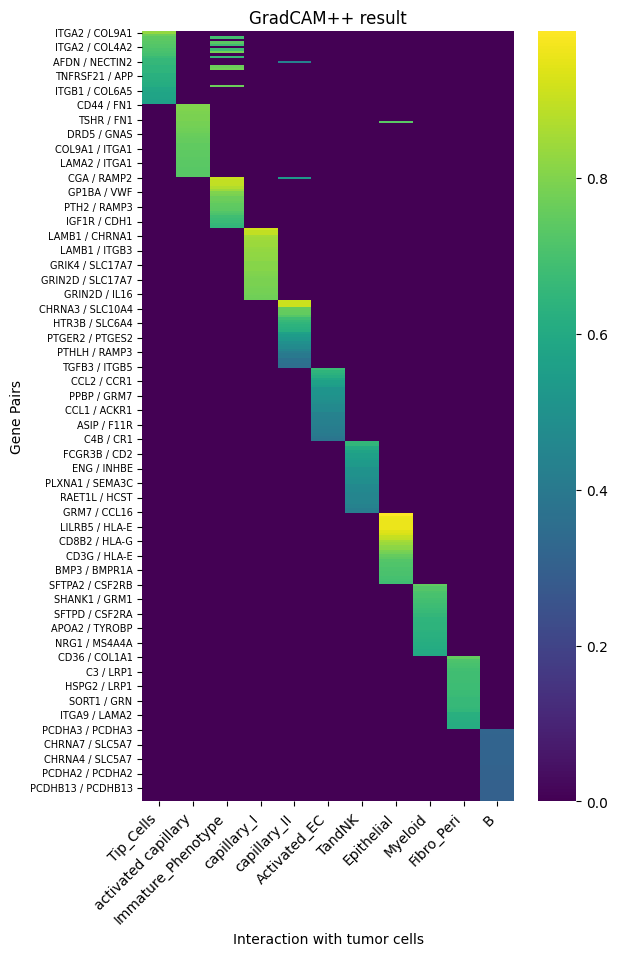

In [11]:
# 각 클래스 이름
class_names = ['Tip_Cells', 'activated capillary', 'Immature_Phenotype',
               'capillary_I', 'capillary_II', 'Activated_EC', 'TandNK', 
               'Epithelial', 'Myeloid', 'Fibro_Peri', 'B']

# 각 클래스별 데이터 프레임을 저장할 리스트
dfs_list = []

# 각 클래스별로 데이터 처리
for class_name in class_names:
    df = dfs[class_name]
    top50_count = df.sort_values(by='Count', ascending=False).head(50)
    top10_df = top50_count.sort_values(by='Mean Normalized_Weight', ascending=False).head(30)
    
    gene_pairs = top10_df[['TumorCell', class_name]]
    weights = top10_df['Mean Normalized_Weight']
    
    temp_df = pd.DataFrame({
        'Gene Pair': gene_pairs.apply(lambda x: f"{x['TumorCell']} / {x[class_name]}", axis=1),
        class_name: weights
    }).set_index('Gene Pair')
    
    # 리스트에 각 데이터프레임 추가
    dfs_list.append(temp_df)

# 데이터프레임들을 하나로 합치기
full_heatmap_data = pd.concat(dfs_list, axis=1)

# NaN 값은 0으로 대체
full_heatmap_data.fillna(0, inplace=True)

# 히트맵 그리기
plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(full_heatmap_data, annot=False, cmap='viridis', fmt=".2f")
for tick in heatmap.get_xticklabels():
    tick.set_rotation(45)
    tick.set_horizontalalignment('right')

plt.title('GradCAM++ result')
plt.xlabel('Interaction with tumor cells')
plt.ylabel('Gene Pairs')
plt.yticks(fontsize=7)
plt.show()


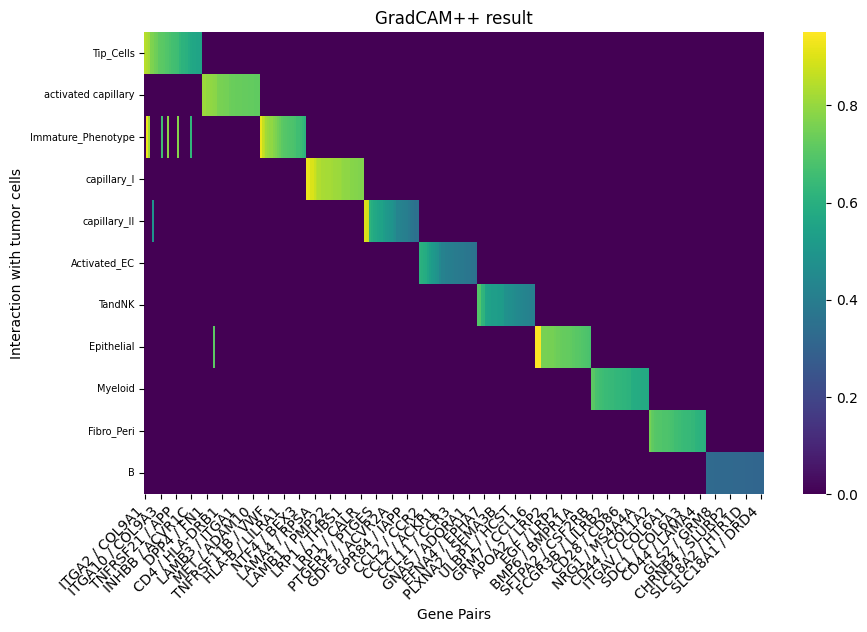

In [165]:
# 각 클래스 이름
class_names = ['Tip_Cells', 'activated capillary', 'Immature_Phenotype',
               'capillary_I', 'capillary_II', 'Activated_EC', 'TandNK', 
               'Epithelial', 'Myeloid', 'Fibro_Peri', 'B']

# 각 클래스별 데이터 프레임을 저장할 리스트
dfs_list = []

# 각 클래스별로 데이터 처리
for class_name in class_names:
    df = dfs[class_name]
    top50_count = df.sort_values(by='Count', ascending=False).head(50)
    top10_df = top50_count.sort_values(by='Mean Normalized_Weight', ascending=False).head(30)
    
    gene_pairs = top10_df[['TumorCell', class_name]]
    weights = top10_df['Mean Normalized_Weight']
    
    temp_df = pd.DataFrame({
        'Gene Pair': gene_pairs.apply(lambda x: f"{x['TumorCell']} / {x[class_name]}", axis=1),
        class_name: weights
    }).set_index('Gene Pair')
    
    # 리스트에 각 데이터프레임 추가
    dfs_list.append(temp_df)

# 데이터프레임들을 하나로 합치기
full_heatmap_data = pd.concat(dfs_list, axis=1)

# NaN 값은 0으로 대체
full_heatmap_data.fillna(0, inplace=True)

# 히트맵 그리기 및 저장
plt.figure(figsize=(10, 6))
heatmap = sns.heatmap(full_heatmap_data.T, annot=False, cmap='viridis', fmt=".2f")  # .T를 사용하여 행과 열을 전환
for tick in heatmap.get_xticklabels():
    tick.set_rotation(45)
    tick.set_horizontalalignment('right')

plt.title('GradCAM++ result')
plt.xlabel('Gene Pairs')
plt.ylabel('Interaction with tumor cells')
plt.yticks(fontsize=7)
plt.savefig('heatmap_result.png', bbox_inches='tight')
plt.show()


### TEC

In [143]:
import numpy as np
import random
import itertools
from itertools import combinations
import anndata
import os
import pandas as pd
import scanpy as sc
from scipy.sparse import issparse

path = '/home/nccpml/DATA2/hanbyeol/TEC/CCI_res08/'

dfs = {}
file_list = [f for f in os.listdir(path) 
            if f.startswith("gcam_") and f.endswith(".csv")]

for file in file_list:
    key = file.split("gcam_")[1].split("_res")[0]  # 'gcam_' 이후와 '._res' 이전의 문자열 추출
    df = pd.read_csv(path + file)
    dfs[key] = df


In [144]:
path = '/home/nccpml/DATA2/hanbyeol/TEC/h5ad_data/'
adata_gs = sc.read(path+'CCA_Lung_minor_gs_0424.h5ad')
adata_gs

## 유잔자 발현 확인
adata_gs_tumor = adata_gs[adata_gs.obs['cell_type_minor'] == 'tumor'].copy()
adata_gs_Tip_Cells = adata_gs[adata_gs.obs['cell_type_minor'] == 'TEC'].copy()
adata_gs_ac = adata_gs[adata_gs.obs['cell_type_minor'] == 'NEC'].copy()

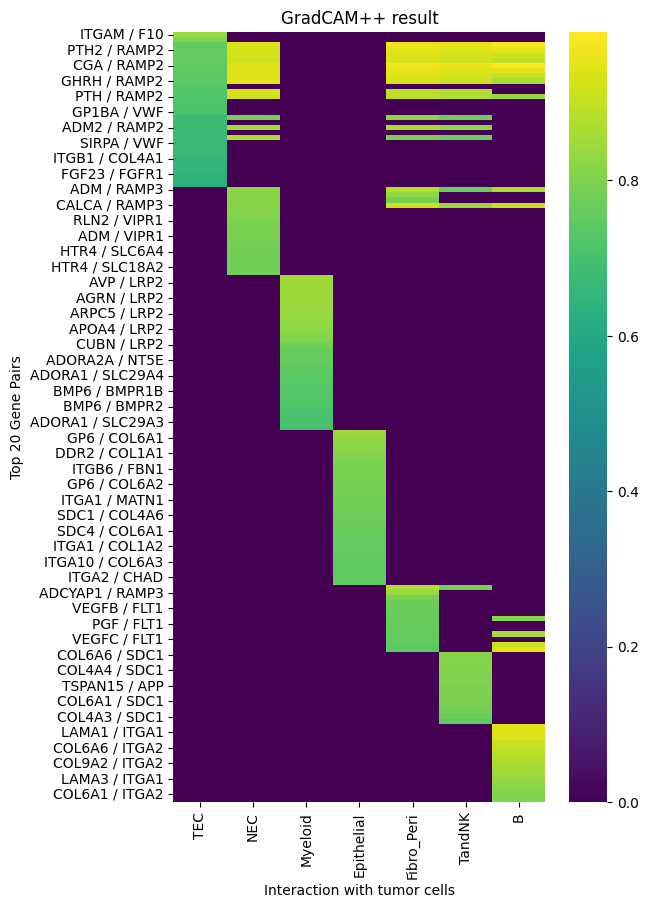

In [150]:
# 각 클래스 이름
class_names = ['TEC', 'NEC', 'Myeloid', 'Epithelial', 'Fibro_Peri', 'TandNK', 'B']

# 전체 히트맵 데이터를 위한 빈 데이터프레임 초기화
full_heatmap_data = pd.DataFrame()

# 각 클래스별로 데이터 처리
for class_name in class_names:
    df = dfs[class_name]
    top50_count = df[df['Count'] >= 9]
    top10_df = top50_count.sort_values(by='Mean Normalized_Weight', ascending=False).head(30)
    
    # 유전자 페어 (TumorCell, 해당 클래스의 Cell) 및 Mean Normalized_Weight 추출
    gene_pairs = top10_df[['TumorCell', class_name]]
    weights = top10_df['Mean Normalized_Weight']
    
    # 유전자 페어 이름과 가중치를 포함하는 임시 데이터프레임 생성
    temp_df = pd.DataFrame({
        'Gene Pair': gene_pairs.apply(lambda x: f"{x['TumorCell']} / {x[class_name]}", axis=1),
        class_name: weights
    }).set_index('Gene Pair')
    
    # 전체 히트맵 데이터에 합치기
    full_heatmap_data = pd.concat([full_heatmap_data, temp_df], axis=1)

# NaN 값은 0으로 대체
full_heatmap_data.fillna(0, inplace=True)

# 히트맵 그리기
plt.figure(figsize=(6, 10))
sns.heatmap(full_heatmap_data, annot=False, cmap='viridis', fmt=".2f")
plt.title('GradCAM++ result')
plt.xlabel('Interaction with tumor cells')
plt.ylabel('Top 20 Gene Pairs')
plt.show()


In [ ]:
## 결과로 나온 유전자 발현 확인

/home/hanbyeol/.conda/envs/py39/lib/python3.9/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 5569 × 36601
    obs: 'n_counts', 'n_genes', 'mito', 'doublet_scores', 'predicted_doublets', 'Dataset', 'Anno_low', 'Anno_high', 'Organ_orig', 'Organ', 'Platform', 'Sample', 'Patient', 'Subtype', 'Tissue_site', 'Tissue', 'Meta_site', 'Treatment', 'Immunotherapy', 'Response', 'CancerType', 'CancerAbbr', 'DataOrgTis', 'PtOrgTis', 'SpOrgTis', 'OrgTis', 'leiden', 'Sample_Origin', 'Status', 'Diagnosis', 'anno_new', 'cnv_status', 'anno_final2207', 'anno_figure', 'anno_specific', 'anno_fig_specific', 'anno_2211', 'F1C', 'anno_cat', 'anno_2212', 'cnv_leiden', 'cnv_score', 'anno_2402'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'chromosome', 'start', 'end', 'gene_id', 'gene_name'
    uns: 'anno_2212_colors', 'anno_2402_colors', 'anno_cat_colors', 'cnv', 'cnv_leiden_colors', 'cnv_neighbors', 'cnv_status_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_cnv', 'X_cnv_pca', 'X_cnv_umap', 'X_pca', 'X_um

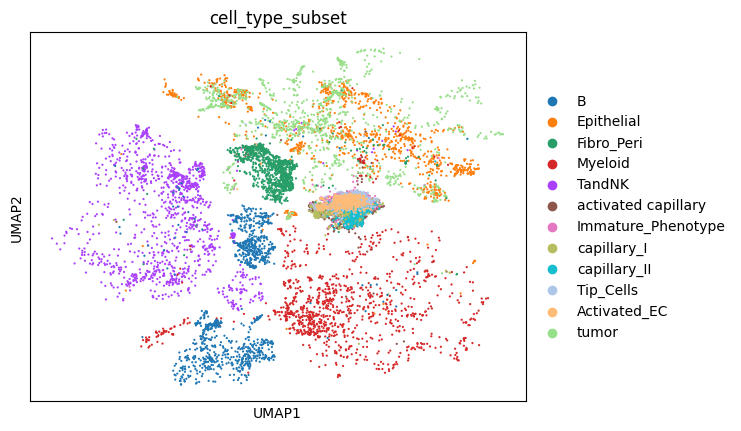

In [44]:
sc.pl.umap(adata_gs, color='cell_type_subset', ncols=2, size=10)

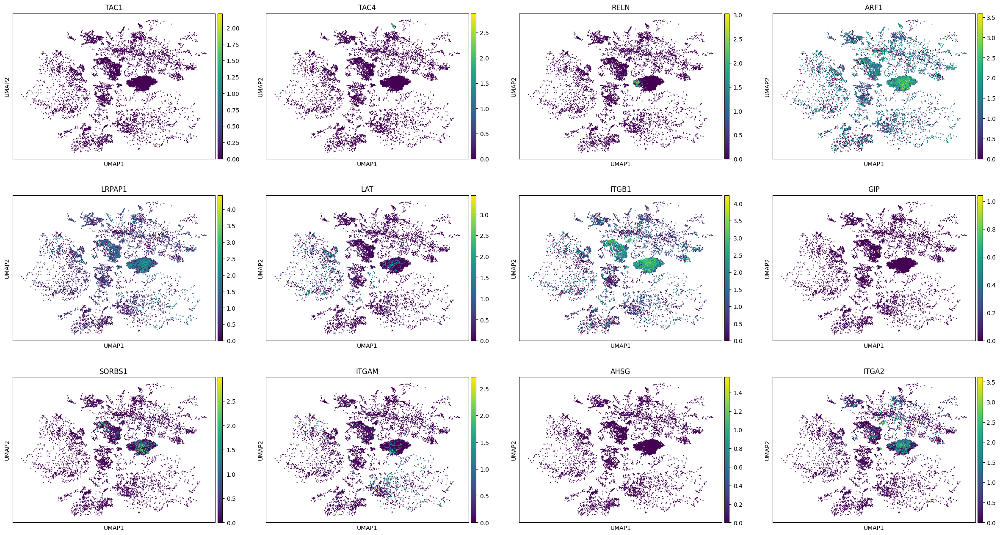

In [53]:
sc.pl.umap(adata_gs, color=gc_tumor_geneset, ncols=4)

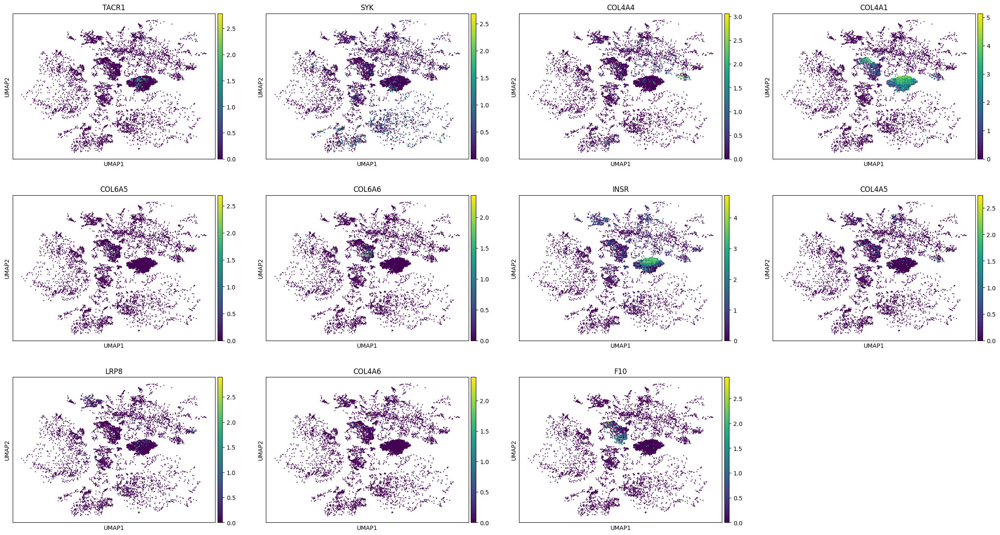

In [54]:
sc.pl.umap(adata_gs, color=gc_Tip_Cells_geneset, ncols=4)

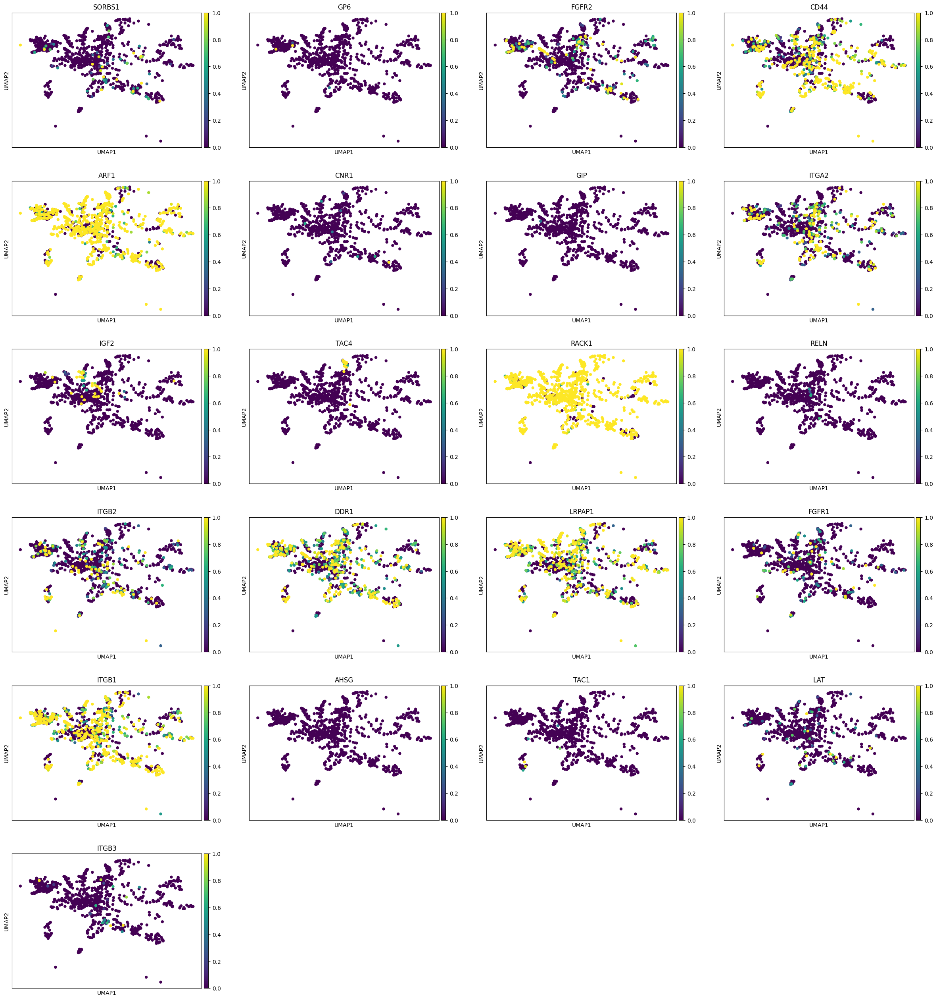

In [52]:
sc.pl.umap(adata_gs, color=gc_ac_geneset, ncols=4, vmin=0, vmax=1)

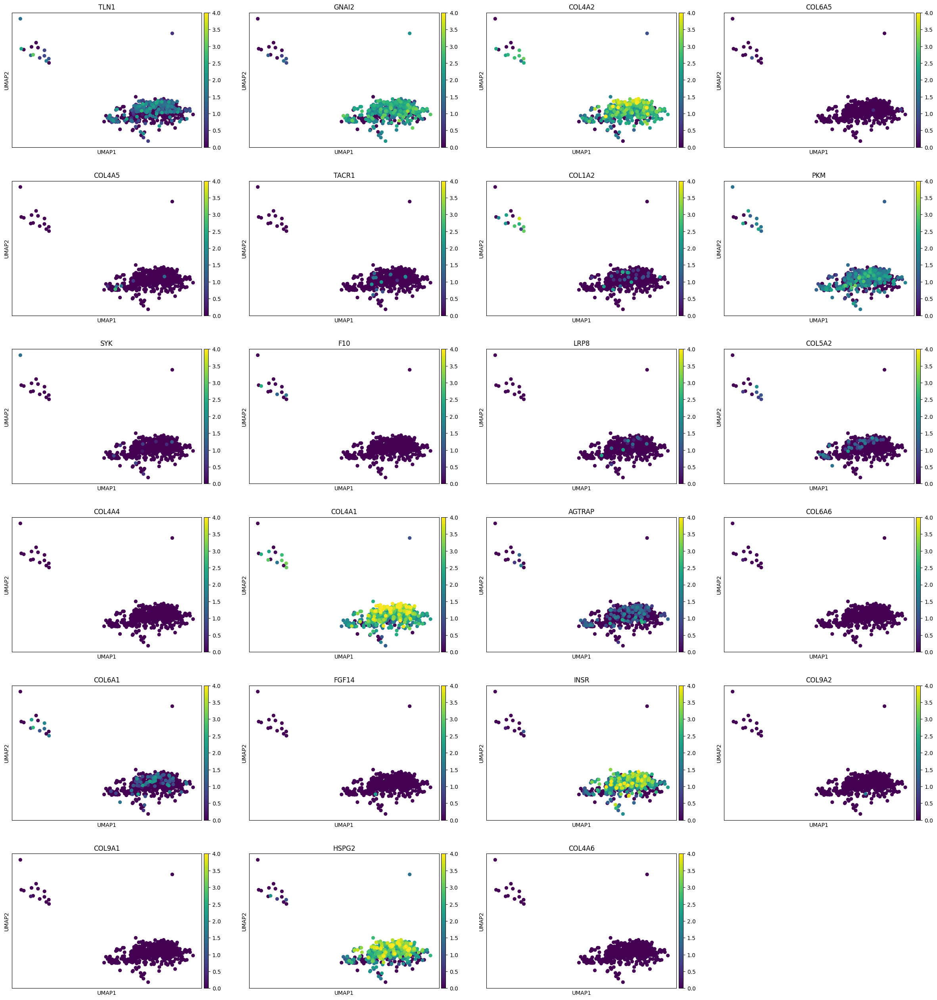

In [54]:
sc.pl.umap(adata_gs_Tip_Cells, color=gc_TEC_geneset, ncols=4, vmin=0, vmax=4)

In [13]:
# NTAMI 데이터 로드
path = '/home/nccpml/DATA2/hanbyeol/TEC/CCI_res031/'

dfs_NT = {}
file_list = [f for f in os.listdir(path) 
            if f.startswith("NATMI_") and f.endswith(".csv")]

for file in file_list:
    # 파일 이름에서 필요한 부분을 추출 (예: 'NATMI_Fibro_Peri.csv'에서 'Fibro_Peri')
    key = file.split("_")[1].split(".")[0]  # 'NATMI_' 이후와 '.csv' 이전의 문자열 추출
    df = pd.read_csv(path + file)
    dfs_NT[key] = df  # 데이터 프레임을 딕셔너리에 저장

for key, df in dfs_NT.items():
    df['NT_index'] = df.index  # 현재 인덱스를 'NT_index'라는 이름의 새로운 컬럼에 추가
    dfs_NT[key] = df  # 딕셔너리를 업데이트하여 변경사항을 반영


In [147]:
dfs_NT['TEC']

,Tumor,TEC,Interaction,Edge Avg Expr Derived Specificity,Edge Total Expr Derived Specificity,NT_index
0,F2,F2RL3,L-R,0.374393,0.337498,0
1,DLL3,NOTCH4,L-R,0.393908,0.293137,1
2,BMP10,ACVRL1,L-R,0.418798,0.274662,2
3,BMP10,ENG,L-R,0.385287,0.244083,3
4,SLURP1,CHRNA7,L-R,0.304119,0.218830,4
...,...,...,...,...,...,...
2949,VCAM1,ITGB7,L-R,0.000019,0.000007,2949
2950,TNFRSF13B,TNFSF13B,R-L,0.000015,0.000007,2950
2951,CXCR2,CXCL6,R-L,0.000014,0.000005,2951
2952,ACKR1,CCL7,R-L,0.000009,0.000005,2952


In [14]:
NT_tumor_geneset = dfs_NT['TEC'].head(n=15)['Tumor'].tolist()
NT_tumor_geneset = list(set(NT_tumor_geneset))
NT_TEC_geneset = dfs_NT['TEC'].head(n=15)['TEC'].tolist()
NT_TEC_geneset = list(set(NT_TEC_geneset))

In [15]:
for gene in NT_tumor_geneset:
    print(f"{gene}: {adata_gs_tumor.to_df()[gene].sum()}")

DKK4: 0.5829731225967407
NPPB: 3.336831569671631
AVP: 2.7158193588256836
LGI1: 1.7538552284240723
HRH4: 2.5227200984954834
GRM1: 1.6265535354614258
BMP10: 0.635821521282196
SLURP1: 1.9456915855407715
BMP15: 0.3486870229244232
CALCB: 5.764167785644531
EPHA6: 2.1242713928222656
COL2A1: 13.449638366699219
F2: 4.583879470825195
DLL3: 28.920522689819336


In [16]:
for gene in NT_TEC_geneset:
    print(f"{gene}: {adata_gs_TEC.to_df()[gene].sum()}")

F2RL3: 157.18292236328125
BMPR2: 264.02728271484375
ADAM11: 1.2398782968521118
CALCRL: 438.41168212890625
ITGA10: 78.57135009765625
CHRNA7: 4.6947431564331055
LRP6: 77.37847900390625
NPR1: 92.47393035888672
NOTCH4: 500.6982116699219
AVPR2: 15.219256401062012
CCL16: 3.0701522827148438
ENG: 603.9867553710938
EFNB2: 376.524169921875
ACVRL1: 312.1809387207031


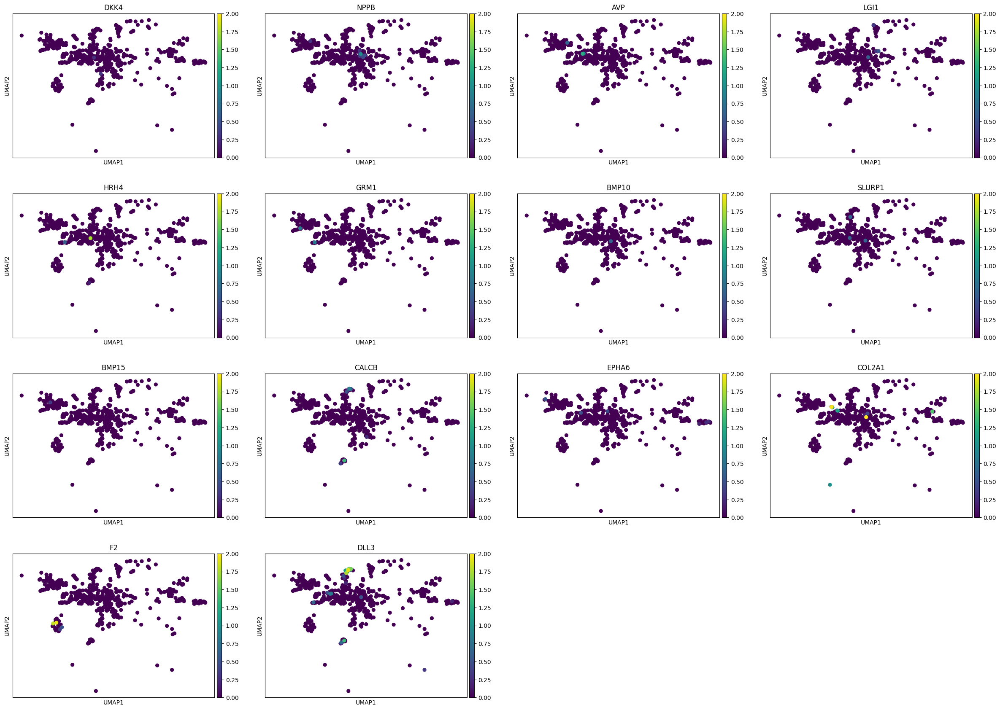

In [17]:
sc.pl.umap(adata_gs_tumor, color=NT_tumor_geneset, ncols=4, vmin=0, vmax=2)

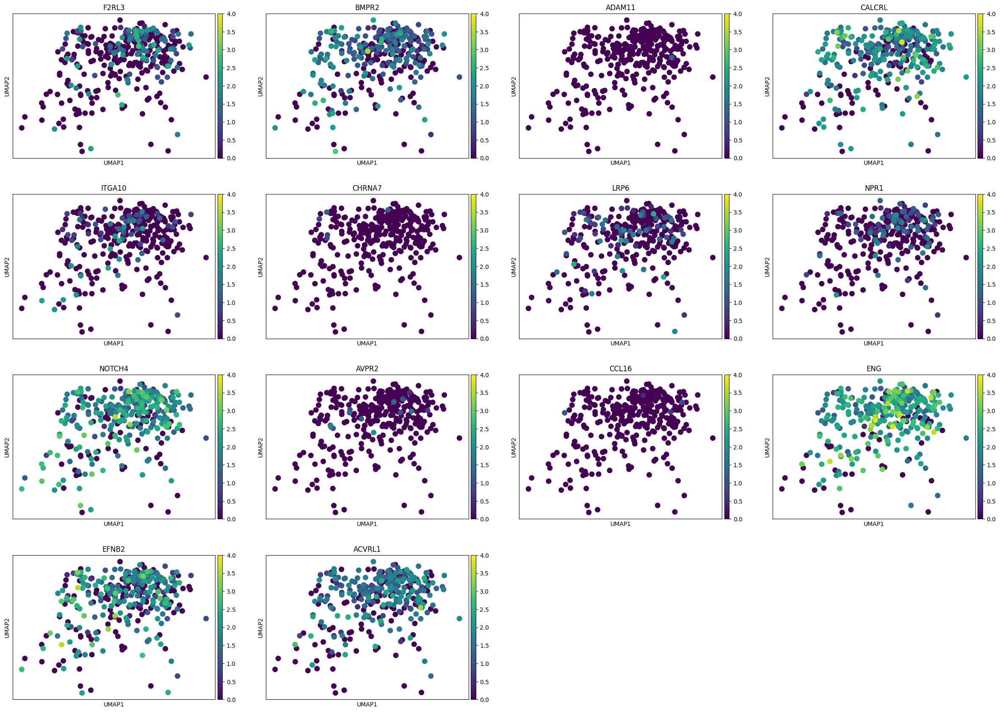

In [18]:
sc.pl.umap(adata_gs_TEC, color=NT_TEC_geneset, ncols=4, vmin=0, vmax=4)

In [19]:
# 데이터 로드
sc_res = pd.read_csv(path + "CCI_SCSR_res.csv")
# sc_res.reset_index(inplace=True)
# sc_res.rename(columns={'index': 'SC_Index'}, inplace=True)
sc_res = sc_res[['Tumor', 'TEC', 'LRscore', 'SC_Index']]

In [20]:
sc_tumor_geneset = sc_res.head(n=15)['Tumor'].tolist()
sc_tumor_geneset = list(set(sc_tumor_geneset))
sc_TEC_geneset = sc_res.head(n=15)['TEC'].tolist()
sc_TEC_geneset = list(set(sc_TEC_geneset))

In [166]:
for gene in sc_tumor_geneset:
    print(f"{gene}: {adata_gs_tumor.to_df()[gene].sum()}")

GNAS: 946.4168701171875
CALM2: 1372.587646484375
KLRC2: 8.083084106445312
EPHB2: 45.86891174316406
CALM1: 1096.85107421875
BMPR1B: 32.780609130859375
GPR162: 54.340476989746094
GJB2: 56.122657775878906
ADRA2A: 20.786165237426758
LPAR3: 24.56520652770996
ADORA1: 16.815420150756836


In [167]:
for gene in sc_TEC_geneset:
    print(f"{gene}: {adata_gs_TEC.to_df()[gene].sum()}")

GNAI2: 529.576904296875
GNAS: 606.4113159179688
EFNB2: 376.524169921875
ANXA1: 371.69110107421875
MYLK2: 7.928647041320801
RTN4: 414.88116455078125
AVPR2: 15.219256401062012
APP: 769.3790283203125
P4HB: 335.37567138671875
CACNA1C: 16.686443328857422
UBA52: 750.048583984375
B2M: 1639.63525390625


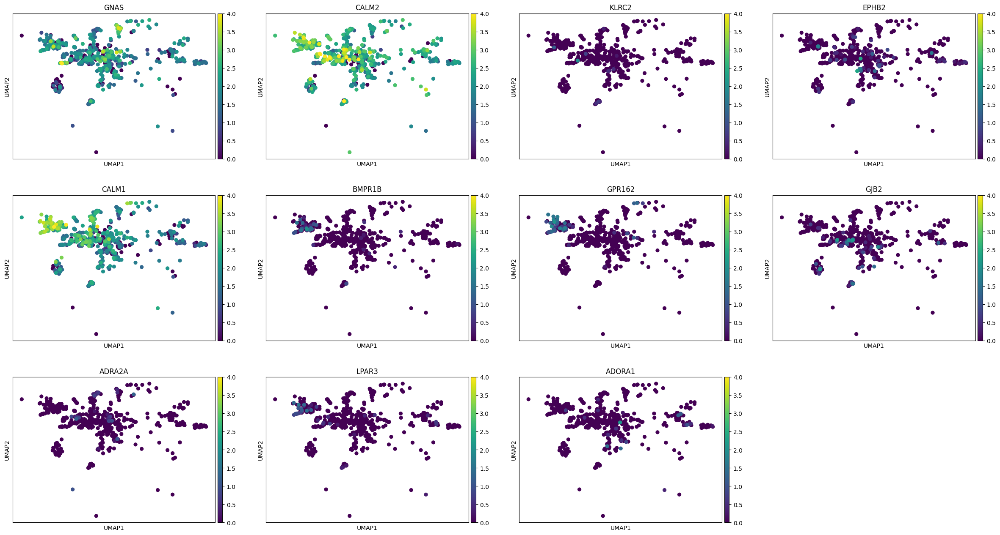

In [168]:
sc.pl.umap(adata_gs_tumor, color=sc_tumor_geneset, ncols=4, vmin=0, vmax=4)

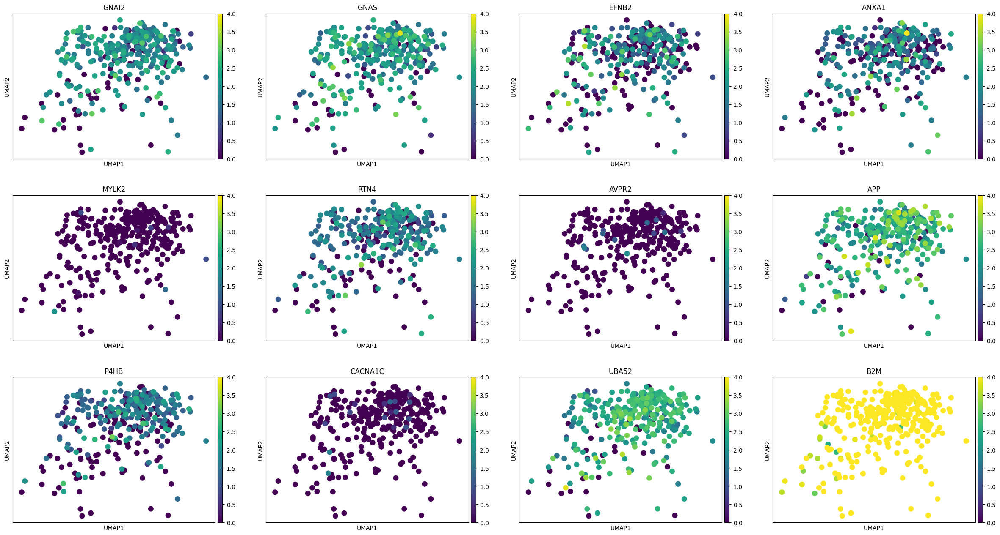

In [169]:
sc.pl.umap(adata_gs_TEC, color=sc_TEC_geneset, ncols=4, vmin=0, vmax=4)

In [19]:
# path = '/home/nccpml/DATA2/hanbyeol/TEC/h5ad_data/'
# adata = sc.read(path+'CCA_Lung_reanno.h5ad')
# adata

In [ ]:
sc.pl.umap(adata, color='anno_2402', ncols=2)

In [ ]:
sc.pl.umap(adata, color=Tumor_geneset, ncols=2)

In [ ]:
# adata_TandNK = adata[adata.obs['anno_2402'] == 'TandNK'].copy()
# adata_Myeloid = adata[adata.obs['anno_2402'] == 'Myeloid'].copy()
adata_tumor = adata[adata.obs['anno_2402'] == 'tumor'].copy()
# adata_B = adata[adata.obs['anno_2402'] == 'B'].copy()
# adata_Epithelial = adata[adata.obs['anno_2402'] == 'Epithelial'].copy()
adata_NEC = adata[adata.obs['anno_2402'] == 'NEC'].copy()
adata_TEC = adata[adata.obs['anno_2402'] == 'TEC'].copy()


In [ ]:
sc.pl.umap(adata_tumor, color=Tumor_geneset, ncols=2)

In [ ]:
sc.pl.umap(adata_TEC, color=TEC_geneset, ncols=2)
